<h1>Audio Filtering - Digital Signal and Image Processing project</h1>
<h2>Federica Tamerisco S4942412</h2>

In [39]:
import numpy as np
import scipy.signal as signal
import matplotlib.pyplot as plt
%matplotlib inline

import IPython
import scipy.io.wavfile as wav

<h2>1. Theoretical background</h2>

To tackle the task of signal processing, we first have to introduce the concept of a <b>piece-wise continuous</b>: with this term we indicate a function $ f $ that is continuous in its period except for a finite number of jump discontinuities.<br>
Any piece-wise continuous can be expressed as a linear combination of properly normalized harmonic functions and it can be written as a <b>Fourier series expansion</b> of the function: $ f(t) = \sum_{n=0}^{\infty} f_n \, \phi_n(t) $.<br>
It represents a periodic signal as a sum of harmonics with discrete frequencies.<br>
We can generalize it to functions over the entire real line using the <b>Fourier Transform (FT)</b>: instead of decomposing a signal into discrete coefficients, it gives a continuous function of frequency $ \omega=2\pi v $.

We can consider also the <b>Fast Fourier Transform (FFT)</b> algorithm, that computes the <b>Discrete Fourier Transform (DFT)</b> and its inverse: the first is obtained by segmenting the sequence into pieces of different frequences, as depicted in the formula $ X_k = \sum_{m=0}^{n-1} x_m e^{-i2\pi km/n} \ $.

This theory can be applied in the context of audio filtering; however a simple Fourier Transform is not the best choice in the case of multiple frequencies inside the same plot, as it would result in a cluttered visualization.<br>
Therefore, we introduce the <b>Short-Time Fourier Transform (STFT)</b> [1] to produce a <b>spectogram</b>: a heatmap of time ($ x $ axis) and frequency ($ y $ axis), where the colors depict different magnitude values (the "strength" or "loudness").<br>
In the code, the STFT is computed directly inside the <tt>plt.specgram()</tt> function [2].<br>
The signal $ x(t) $ is split into frames of equal length <tt>NFTT</tt>: in this case, it's set equal to the signal rate, so the length is 1 second.<br>
Then, each frame is multiplied by a <b>Hann window function</b> $ \omega(\tau) $, which is non-zero for only a short period of time.<br>
To compute the frequency spectrum, we apply a FFT to each frame to obtain the magnitude and to store it as a column on the spectogram.<br>
Since we have finite windows and fixed frequency bins, we are using a <b>Continous-Time STFT</b>: the corresponding equation is $ STFT\{x(t)\}(\tau,\omega)=X(\tau,\omega)= \int_{-\infty}^{+\infty} x(t)\omega(t-\tau)e^{-i\omega t} \, dt $.

In [40]:
def stft(signal_rate, audio):
    plt.figure(figsize=(12, 5))
    spectrum, freqs, bins, img = plt.specgram(audio, NFFT = signal_rate, Fs = signal_rate, noverlap = int(signal_rate/2), cmap = plt.cm.Spectral, mode = 'magnitude', vmin=0, vmax=180)
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [s]')
    plt.ylim(0, 2e3)
    plt.title("Spectrogram")
    plt.colorbar();

<h3>1.1 Linear Time-Invariant Systems</h3>

A physical system $ L $ is a transducer that takes the input signal $ f_i(t) $ and produces the output: $ L\{f_i(t)\}=f_o(t) $.<br>
As the name suggests, an LTI system is characterized by two main properties:

* <b>linearity</b><br>Considering two signals $ f_i(t) $ and $ g_i(t) $, if we perform an action on the input, it remains on the output: $ L\{af_i(t)+bg_i(t)\}=af_o(t)+bg_o(t) $
* <b>time-invariance</b><br>A time shift of the input produces the same time shift in the output: $ L\{f_i(t-s)\}=f_o(t-s) $

In the frequency domain, the quantitative measure of the magnitude and the phase of the output is the <b>frequency response</b> $ H(\omega) $ [5]: it relates the output to a sinusoidal input of frequency $ \omega $.<br>
It's also the FT of the <b>impulse response</b> $ h(t)=L\{\delta(t)\} $, that characterizes the system in the time domain.<br>
The output is given by the convolution of $ h(t) $ with the input: $ f_o(t)=(f_i*h)(t)=\int_{-\infty}^{+\infty} f_i(s)h(t-s) \, ds $.<br>
Considering the FT, in the frequency domain this becomes $ F_o(\omega)=F_i(\omega)H(\omega) $, where $ H(\omega) $ is the FT of the impulse response, called <b>system function</b>.<br>
If the impulse response is finite in duration, the system is called a <b>Finite Impulse Response (FIR)</b>: $ H(\omega) $ is a polynomial in $ e^{-i\omega} $.<br>
If instead it has an infinite duration, the system is an <b>Infinite Impulse Response (IIR)</b>: $ H(\omega) $ results in a rational function in $ e^{-i\omega} $, so we have $ H(\omega)=\frac{\sum_{n=0}^{N}b_ne^{-i\omega n} }{1+\sum_{n=1}^{M}a_ne^{-i\omega n} } $, where $ k $ is the discrete-time step of the impulse response.

If we take a continuous-time signal and we record it only at discrete time steps, we are sampling.<br>
We are essentially multiplying the signal by an infinite <b>impulse train</b> of period $ T_s $.<br>
In the time domain it corresponds to an infinite periodic repetition of the signal’s spectrum, centered around integer multiples of the sampling frequency $ \omega _s=\frac{2\pi}{T_s} $.<br>
The train can be described as

* $ i(t)=\sum_{n=-\infty}^{+\infty} \delta(t-nT_s) \ $
* $ i(t)=\frac{1}{T_s}\sum_{-\infty}^{+\infty} c_ke^{ikt\omega _s} $ (Fourier series form)

In this context, it's important to consider the <b>Nyquist frequency</b> $ \frac{\omega _s}{2} $ as the limit in sampling: as the <b>Shannon sampling theorem</b> states, if a signal contains no frequency components higher than the Nyquist frequency, you must sample at a rate $ \omega _s>2\omega _b $ to capture all its information without distortion.<br>
$ s_smp(\omega)=\frac{1}{T_s}\sum_{-\infty}^{+\infty} S(\omega -l\omega _s) $

<h3>1.2 Digital Filters</h3>

To observe how the spectrogram changes with different type of filtering, it's necessary to use a <b>Digital Filter</b> [3,4], that represents the signal like a sequence of numbers instead of using voltage or current.<br>
The raw signal is in the form of a voltage waveform described by the function $ V = x(t) $.<br>
An <b>Analog-to-Digital Converter</b> samples it at certain time intervals $ h $: the sampled value at time $ t=ih $ is $ x_i=x(ih) $.<br>
The resulting samples correspond to the values of the signal waveform at $ t=0,h,...,nh $ and they're described by representative binary numbers.<br>
Those are then passed through the processor (a PC or a Digital Signal Processor chip) that performs numerical calculations to produce a sequence of values $ y_0,...,y_n $.<br>
Lastly, this sequence is passed through a <b>Digital-to-Analog Converter</b>.

<img src="imgs/digital filter.png">

We can consider <b>linear filters</b>: they're LTI systems that can emphasize or suppress certain frequencies, depending on the case.<br>
The <b>gain</b> $ G(\omega) $ is how much the filter amplifies or attenuates the signal at a specific frequency, while the speed at which it changes is the <b>slope</b>, measured in decibels per octave.<br>
In this context we define
* <b>passband</b>: range of frequencies that pass through the filter
* <b>stopband</b>: range of frequencies that are rejected
* <b>transition band</b>: the in-between [14]

A so called <b>ideal filter</b> would have a flat passband, so all of the frequencies outside would be rejected completely.<br>
Its frequency response is a <b>rectangular function</b> $ p_T(t)= \begin{cases}
1 & -T<=t<=T \\
0 & otherwise
\end{cases} $.<br>
Unfortunately, applying an ideal filter is not possible without having signals of infinite extent time.<br>
Therefore, we generally approximate it by truncating and windowing into a FIR: this means that we are delaying the signal and seeing it manifesting into a phase shift.<br>
We have a region on the boundary of the passband where the frequencies that should be rejected are instead only attenuated.<br>
However, this can result in artifacts like the <b>Gibbs phenomenon</b>: we have some overshooting caused by high-frequency terms that can't be removed.

<img src="imgs/gibbs.png" style="width: 20rem">

The variety of windowing function can lead to a change in this effect.<br>
For example, when truncating the sinc function we create severe ringing artifacts, and those can be reduced using window functions that drop off more smoothly at the edges [5].

Given these terminologies, we define the different types of linear filters:

* <b>Low-Pass Filter (LPF)</b> and <b>High-Pass Filter (HPF)</b>
* <b>Band-Pass Filter (BPF)</b> and <b>Band-Stop Filter (BSF)</b>
* <b>Comb Filter</b>
* <b>All-Pass Filter (APF)</b>

To better understand the different effect of these filters on the same audio, I selected the first 2 macro-categories.<br>
We can design different families of filters depending on the desired frequency behavior:

* <b>Butterworth</b>
* <b>Chebyshev</b>
* <b>Bessel-Thomson</b>
* <b>Elliptic</b>

We usually consider up to the 4th order section, but for semplicity in the formulas we'll consider the 2nd.

In [41]:
order = 4

<h3>1.2.1 LPF</h3>

It attenuates the frequencies higher than a <b>cutoff frequency</b> [13]: the point where the transition band and passband meet, usually where the attenuation is 3 dB.

<img src="imgs/lpf.png" style="width: 20rem">

It can be compared to a stiff physical barrier: when music is playing in another room, we hear the lower notes, while the higher ones are attenuated [7].<br>
Thus, it's used to

* remove hiss
* remove sibilance
* isolate bass tones

In this context, I chose to use the Butterworth filter: its main feature is that it has a <b>maximally flat frequence response</b> in the passband, rolling off towards zero in the stopband [9].<br>
This means that it doesn't have <b>ripples</b>: small oscillations in the gain.<br>
Its cutoff is not sharp, so it's used for general purposes but especially as a LP.<br>
The 2nd order transfer function is $ H(z)=G\frac{1+2z^{-1}+z^{-2}}{1+a_1z^{-1}+a_2z^{-2}} $, where

* $ z=e^{j\omega} $ is the complex variable in the z-domain that represents a unit delay in discrete time
* $ a_1=-2\cos(\omega _c) $
* $ a_2=1-\sqrt{2}\sin(\omega _c)+\sin^2(\omega _c) $

To use a Butterworth LPF we call the function <tt>scipy.signal.butter()</tt> [10], that takes as parameters:

* <tt>N</tt>: the order of the filter.
* <tt>Wn</tt>: the critical frequency.<br>For HP and LP it's scalar, while for BP and BS it's a sequence of length 2.
* <tt>btype</tt>: type of filtering to apply.
* <tt>analog</tt>: wheter or not to return an analog filter.

It returns numerator and denominator polynomials of the infinite impulse response filter.<br>
Inside the function we apply <tt>signal.lfilter()</tt> [11], that takes the results and uses them to filter the audio: the result is the output of the digital filter.<br>
At the end, we also apply <tt>np.fft.fft()</tt> to compute the FT by using the FFT and normalizing by the length of the audio.

To better see how the filter behaves, it's better to visualize the frequency response of the analog version with default values.

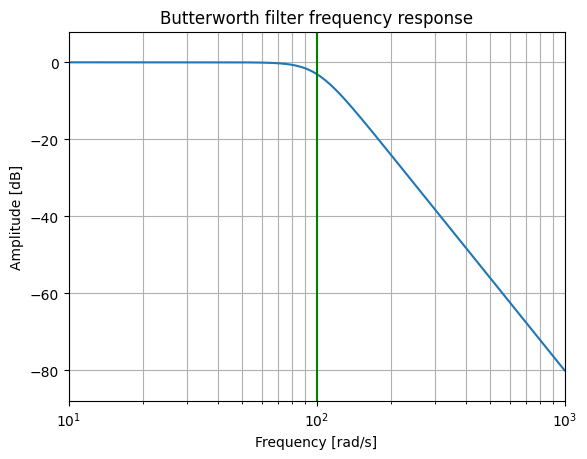

In [42]:
b, a = signal.butter(N=order, Wn=100, btype='low', analog=True)
w, h = signal.freqs(b, a)

plt.semilogx(w, 20 * np.log10(abs(h)))
plt.title('Butterworth filter frequency response')
plt.xlabel('Frequency [rad/s]')
plt.ylabel('Amplitude [dB]')
plt.margins(0, 0.1)
plt.grid(which='both', axis='both')
plt.axvline(100, color='green') # cutoff frequency
plt.show()

<h3>1.2.2 HPF</h3>

It attenuates the frequencies lower than the cutoff frequency.

<img src="imgs/hpf.png" style="width: 20rem">

In the audio context, a specific type of HPF is the <b>rumble filter</b> [12], that removes the sounds closer to the lower end of the audible range (20-20.000 Hz).<br>
This is useful to

* isolate sources: e.g. since voice energy is above 80-100 Hz, we can isolate voice
* remove environmental noise
* remove plosives (vibrations due to the singer's breath into the microphone)
* remove handling noise

[15]

In this context, the most used is the Chebyshev filter: it has a steeper roll-off and it can minimize the error between the idealized filter and the normal one [17].<br>
We have an additional differentiation:

* Type I: most common, where the passband has a ripple 
* Type II: inverse filter, it doesn't roll off as fast and the ripple is in the stopband

Using the Type I as a HPF is optimal as it has a sharp cutoff, while maintaining a reasonable passband shape.<br>
The starting point is typically a LP, to which we apply a frequency transformation.<br>
The transfer function is the same as in Butterworth, but the value of the coefficients is different

* $ a_1=\frac{2\cos(\omega _c)}{1+\sin(\omega _c)} $
* $ a_2=\frac{1-\sin(\omega _c)}{1+\sin(\omega _c)} $

To implement it, we call the function <tt>scipy.signal.cheby1()</tt> [21], that has a new parameter <tt>rp</tt>: it indicates the maximum ripple allowd in the passband below unity gain.

Again, we visualize the frequency response of the analog filter with default values.

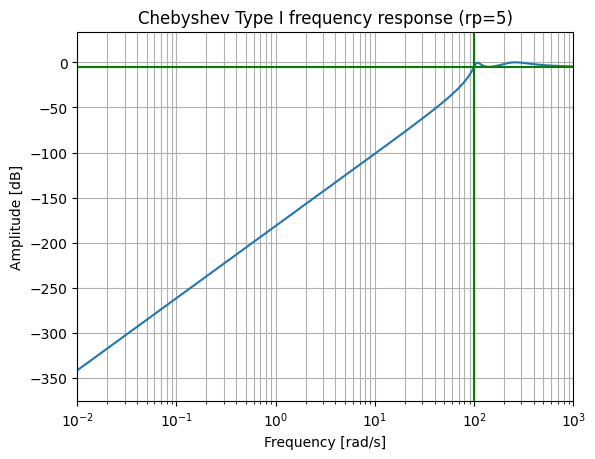

In [43]:
b, a = signal.cheby1(N=order, rp=5, Wn=100, btype='high', analog=True)
w, h = signal.freqs(b, a)

plt.semilogx(w, 20 * np.log10(abs(h)))
plt.title('Chebyshev Type I frequency response (rp=5)')
plt.xlabel('Frequency [rad/s]')
plt.ylabel('Amplitude [dB]')
plt.margins(0, 0.1)
plt.grid(which='both', axis='both')
plt.axvline(100, color='green') # cutoff frequency
plt.axhline(-5, color='green') # rp
plt.show()

<h3>1.2.3 BPF </h3>

It passes frequencies inside the passband and rejects the remainings [16].

<img src="imgs/bpf.png" style="width: 20rem">

It can be constructed by joining in series a HPF, to allow components higher than a cutoff frequency, with a LPF to let through the frequencies lower than another cutoff frequency.<br>
The <b>bandwidth</b> of the filter is the difference between the two frequencies.<br
To choose the cutoff frequencies, we use the <b>shape factor</b>: the ratio of bandwidths using two different attenuations.<br>
The resulting shape of the bands is characterized by the <b>$Q$-factor</b>: the reciprical of the fractional bandwidth.<br>
Therefore, with a high-$Q$ filter we have a narrow passband, while with a low-$Q$ filter we have a wide passband.<br>
Since it can cut both the high and low frequencies, it's used to isolate certain elements of a track (voice, instrument etc.).

In this case, the family to use is Bessel-Thomson [19]: it has a flat phase delay, which preserves the wave shape of filtered signals in the passband.<br>
It's very similar to a Gaussian filter, but it has a small overshoot, which is still less than the one in e.g. Butterworth.

It's excellent when time response is critical, however it has the slowest roll-off, so it’s not great if you need very sharp frequency separation.<br>
The transfer function is $ H(z)=G\frac{b_0+b_2z^{-2}}{1+a_1z^{-1}+a_2z^{-2}} $, where

* $ b_0=\sin(\frac{BW}{2}) $
* $ BW=\omega _{high}-\omega _{low} $ is the bandwidth
* $ b_2=-\sin(\frac{BW}{2}) $
* $ a_1=-2\cos(\omega _0)\cos(\frac{BW}{2}) $
* $ \omega _0=\sqrt{\omega _{high}-\omega _{low}} $ is the center frequency

To apply it, we use the function <tt>scipy.signal.bessel()</tt> [22], that introduces as a new parameter <tt>norm</tt>: it's the critical frequency normalization, that can be

* <tt>phase</tt>: the phase response is led to reach the midpoint at angular frequency <tt>Wn</tt>
* <tt>delay</tt>: the group delays in the passband is made to be 1/<tt>Wn</tt>
* <tt>mag</tt>: the gain magnitude is made to be -3 Db at angular frequency <tt>Wn</tt>

We visualize the analog version of the frequency response with default values.

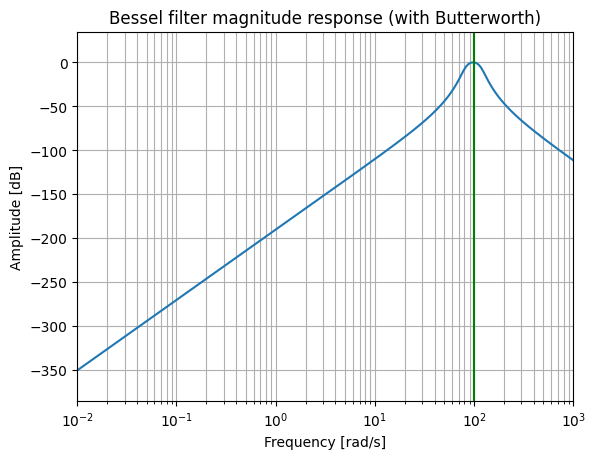

In [44]:
b, a = signal.bessel(N=order, Wn=[80, 120], btype='bandpass', analog=True, norm='phase')
w, h = signal.freqs(b, a)

plt.semilogx(w, 20 * np.log10(np.abs(h)))
plt.title('Bessel filter magnitude response (with Butterworth)')
plt.xlabel('Frequency [rad/s]')
plt.ylabel('Amplitude [dB]')
plt.margins(0, 0.1)
plt.grid(which='both', axis='both')
plt.axvline(100, color='green')  # cutoff frequency
plt.show()

<h3>1.2.4 BSF</h3>

It's the inverse of the BPF [8].<br>

<img src="imgs/bsf.png" style="width: 20rem">

When the stopband is particularly narrow with a high-$Q$ factor, we have a <b>notch filter</b>.<br>
They're used to reduce or prevent audio feedback: the high-pitched noise caused by the proximity between the microphone and the loudspeaker.<br>
Typically, the frequencies vary by semitones, so the width of the stopband is influenced by this.<br>
A common application of the BSF is the <b>anti-hum filter</b>, that suppresses the range 59-61 Hz characteristic of the alternating current sound.

In this case, we use the Elliptic/Cauer filter [20]: it has a ripple in both the passband and stopband.<br>
As the ripple in the stopband reaches 0, the filter becomes a type I Chebyshev.<br>
It's very efficient when you need very tight filtering, however the phase distortion and ripple make it less “transparent” for high-fidelity audio.<br>
The transfer function is $ H(z)=G\frac{1-\cos(\omega _0)z^{-1}+z^{-2}}{1+a_1z^{-1}+a_2z^{-2}} $, where

* $ a_1=-2r\cos(\omega _0) $
* $ 0<r<1> $ is the pole radius, so the distance from the origin to the filter's poles, which are points where the denominator becomes 0
* $ a_2=r^2 $

The function to use is <tt>scipy.signal.ellip()</tt> [23], that introduces the new parameter <tt>rs</tt>: it's the minimum attentuation required in the stopband.

We visualize the analog frequency response with default values.

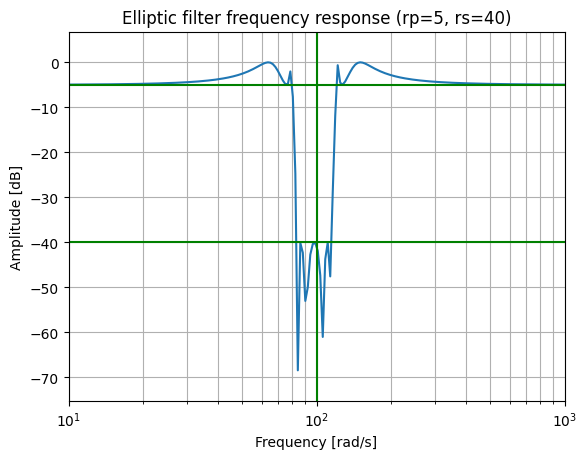

In [45]:
b, a = signal.ellip(N=order, rp=5, rs=40, Wn=[80, 120], btype='bandstop', analog=True)
w, h = signal.freqs(b, a)

plt.semilogx(w, 20 * np.log10(abs(h)))
plt.title('Elliptic filter frequency response (rp=5, rs=40)')
plt.xlabel('Frequency [rad/s]')
plt.ylabel('Amplitude [dB]')
plt.margins(0, 0.1)
plt.grid(which='both', axis='both')
plt.axvline(100, color='green') # cutoff frequency
plt.axhline(-40, color='green') # rs
plt.axhline(-5, color='green') # rp
plt.show()

---

<h2>2. Experiments</h2>
I decided to approach the topic using different types of audios as starting points, to have a broader range of frequencies and elements:

1. voice with background noise
2. instrumental music
3. rock song

I applied to each of them the different types of filtering.

<h3>2.1 Voice with background noise</h3>
For this first part of the project I decided to start from an <a href="https://www.youtube.com/watch?v=B-kyjKqZ3oY">airplane pilot announcement</a>, where a female pilot is talking on top of some background noise.

In [46]:
path = "audio/pilot_announcement.wav"

IPython.display.Audio(path, rate=44100)

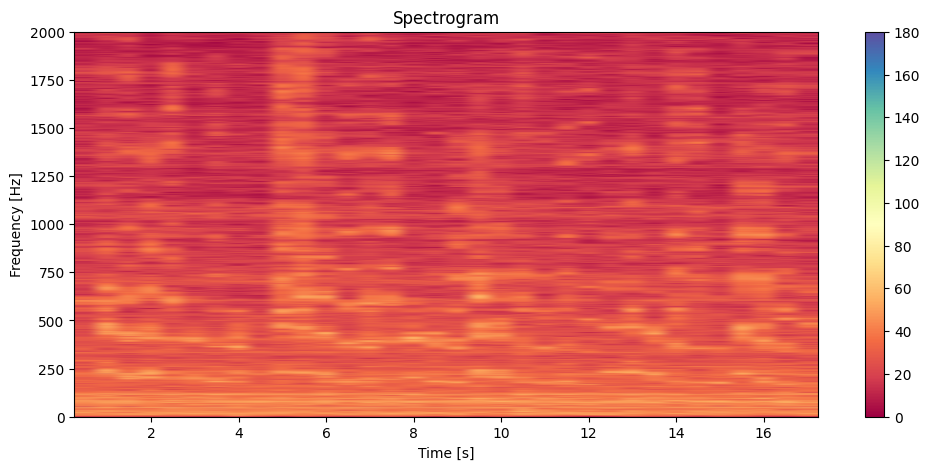

In [47]:
signal_rate, audio = wav.read(path)
stft(signal_rate, audio)

By looking at the spectrogram, we can see that everything presents a reddish haze: these are low frequencies, which indicate the background noise, and they are constant.<br>
The voice of the female pilot is represented by the "stripes" and the fundamental frequency is around 200-250 Hz.

The goal of this experiment would be to suppress the background noise.

<h4>2.2.1 Butterworth LPF</h4>

To remove the background noise we should be handling both the high frequency hiss and the lower frequency noise.<br>
Since this is not possible with only a LP, we consider only the hiss.

In [ ]:
cutoff = 3000

b, a = signal.butter(order, cutoff, "low", fs=signal_rate)
filtered_signal = signal.lfilter(b, a, audio)

IPython.display.Audio(filtered_signal, rate=44100)

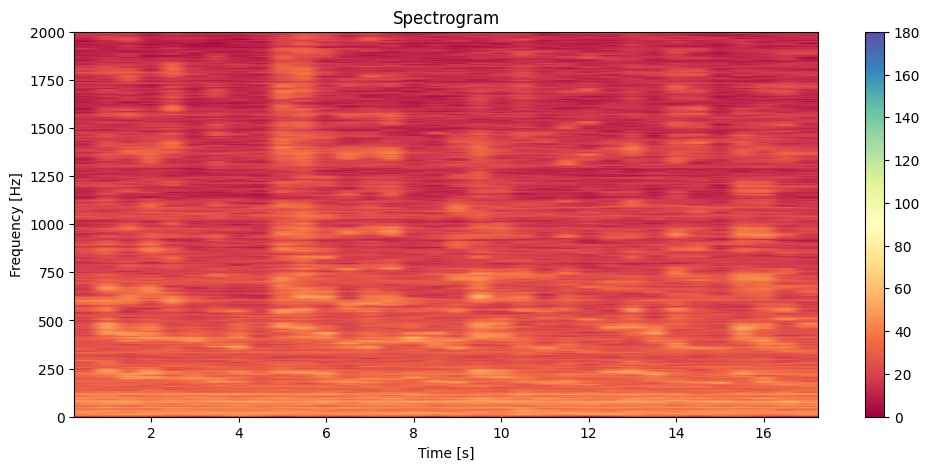

In [62]:
stft(signal_rate, filtered_signal)

The result makes the signal sound "lower".

<h4>2.2.2 Chebyshev HPF</h4>

In [ ]:
cutoff = 200

b, a = signal.cheby1(order, rp=5, cutoff, 'high', fs=signal_rate)

<h4>2.2.3 Bessel BPF</h4>

<h4>2.2.4 Elliptic BSF</h4>

<h3>2.3 Instrumental music</h3>
I chose a snippet from the <a href="https://www.youtube.com/watch?v=KSKn8FKOPu4"><i>Memories of a Sound</i></a> by <i>Taisei Iwasaki</i>.

In [100]:
path = "audio/Memories_of_a_Sound_extract.wav"

IPython.display.Audio(path, rate=44100)

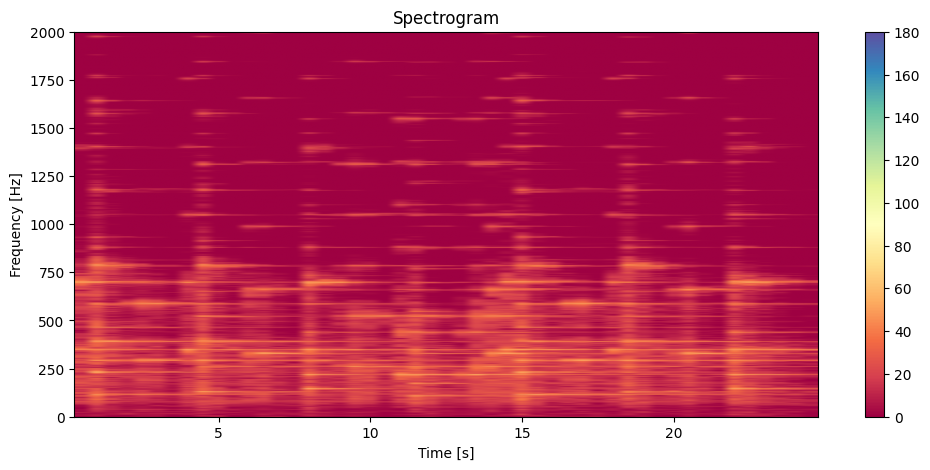

In [101]:
signal_rate, audio = wav.read(path)
stft(signal_rate, audio)

Also in this case the spectrogram shows a majority of red with frequencies approximately in the same range as before.<br>
The difference in this case is that the amount of lower frequencies is much higher: this is because, since it's a single instrument track, the pauses between the notes are only filled with an eco of the previous note.(?)

<h3>2.4 Rock song</h3>
I extracted a part of the song <a href="https://www.youtube.com/watch?v=NdYWuo9OFAw"><i>Iris</i></a> by <i>The Goo Goo Dolls</i>.

In [102]:
path = "audio/Iris_extract.wav"

IPython.display.Audio(path, rate=44100)

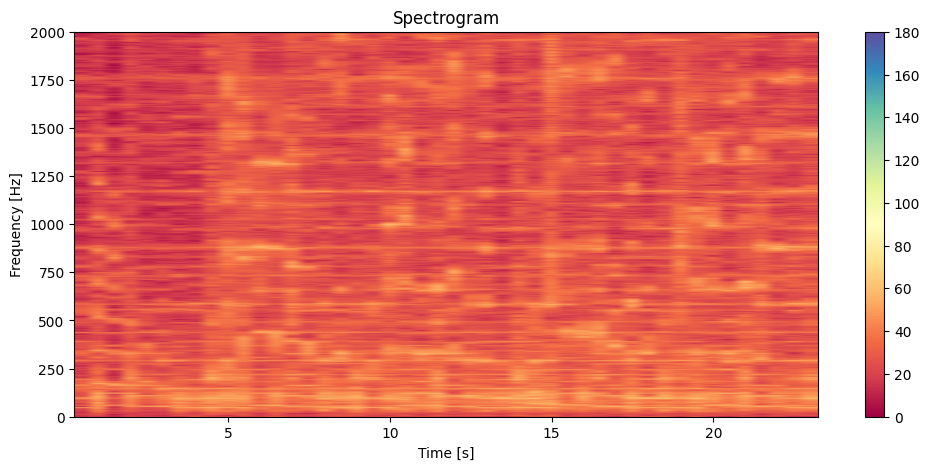

In [103]:
signal_rate, audio = wav.read(path)
stft(signal_rate, audio)

In this case, the spectrogram shows a larger amount of higher frequencies, even if they stay always in the same range of the previous steps.<br>
The singer tone ranges from lower to higher octaves but it doesn't spatiate to much.<br>
The instruments ...

<h2> Conclusions </h2>

---

<h2>Bibliography</h2>

[1] <a href="https://en.wikipedia.org/wiki/Short-time_Fourier_transform">Short-time Fourier transform</a>, <i>Wikipedia</i> 

[2] <a href="https://matplotlib.org/stable/api/%5C_as%5C_gen/matplotlib.pyplot.specgram.html">matplotlib.pyplot.specgram</a>, <i>matplotlib</i>

[3] <a href="https://123.physics.ucdavis.edu/week_5_files/filters/digital_filter.pdf?">INTRODUCTION TO DIGITAL FILTERS</a>, <i>UCDavis</i>

[4] <a href="https://en.wikipedia.org/wiki/Digital_filter">Digital Filter</a>, <i>Wikipedia</i>

[5] <a href="https://en.wikipedia.org/wiki/Frequency_response">Frequency Response</a>, <i>Wikipedia</i>

[6] <a href="https://www.allaboutcircuits.com/technical-articles/low-pass-filter-tutorial-basics-passive-RC-filter/">What Is a Low Pass Filter? A Tutorial on the Basics of Passive RC Filters</a>, <i>All About Circuits</i>

[7] <a href="https://en.wikipedia.org/wiki/Low-pass_filter">Low-pass filter</a>, <i>Wikipedia</i>

[8] <a href="https://en.wikipedia.org/wiki/Band-stop_filter">Band-stop filter</a>, <i>Wikipedia</i>

[9] <a href="https://en.wikipedia.org/wiki/Butterworth_filter">Butterworth filter</a>, <i>Wikipedia</i>

[10] <a href="https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.butter.html">scipy.signal.butter</a>, <i>SciPy</i>

[11] <a href="https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.lfilter.html">scipy.signal.lfilter</a>, <i>SciPy</i>

[12] <a href="https://en.wikipedia.org/wiki/High-pass_filter">High-pass filter</a>, <i>Wikipedia</i>

[13] <a href="https://en.wikipedia.org/wiki/Cutoff_frequency">Cutoff frequency</a>, <i>Wikipedia</i>

[14] <a href="https://en.wikipedia.org/wiki/Filter_(signal_processing)">Filter (signal processing)</a>, <i>Wikipedia</i>

[15] <a href="https://audiouniversityonline.com/audio-high-pass-filters/">What Are Audio HIGH PASS FILTERS & How to Use Them</a>, <i>Audio University</i>

[16] <a href="https://en.wikipedia.org/wiki/Band-pass_filter">Band-pass filter</a>, <i>Wikipedia</i>

[17] <a href="https://en.wikipedia.org/wiki/Chebyshev_filter">Chebyshev filter</a>, <i>Wikipedia</i>

[18] <a href="https://en.wikipedia.org/wiki/Bilinear_transform">Bilinear transform</a>, <i>Wikipedia</i>

[19] <a href="https://en.wikipedia.org/wiki/Bessel_filter">Bessel filter</a>, <i>Wikipedia</i>

[20] <a href="https://en.wikipedia.org/wiki/Elliptic_filter">Elliptic filter</a>, <i>Wikipedia</i>

[21] <a href="https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.cheby1.html">scipy.signal.cheby1</a>, <i>SciPy</i>

[22] <a href="https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.bessel.html">scipy.signal.bessel</a>, <i>SciPy</i>

[23] <a href="https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.ellip.html">scipy.signal.ellip</a>, <i>SciPy</i>